In [6]:
# !unzip /content/Yolo__Data.zip

In [3]:
# !pip install ultralytics --quiet

### **YOLOv8 Training and Validation Pipeline for Tiny Object Detection**

#### **Overview**

This script trains and validates a YOLOv8 object detection model to detect tiny objects (buildings). It includes:

- Visualization of processed images (resized/padded images with bounding boxes).

- Training of the YOLOv8 model with custom parameters.

- Validation of the trained model to evaluate performance using mean Average Precision (mAP).

### **Step 1:** Import Required Libraries

In [14]:
from PIL import Image  # Image processing
import os  # File and directory operations
from ultralytics import YOLO  # YOLOv8 model handling
import cv2  # OpenCV for image manipulation
import numpy as np  # Numerical operations
import random  # Random sampling
import matplotlib.pyplot as plt  # Visualization
import shutil  # File and directory operations
import torch  # PyTorch for deep learning
from google.colab.patches import cv2_imshow  # Display images in Google Colab

### **Step 2:** Image Visualization with Bounding Boxes

In [7]:
def visualize_processed_image(output_dir, subset, img_filename):
    """Visualizes a preprocessed image with bounding boxes."""
    # Construct image and label file paths
    image_path = os.path.join(output_dir, subset, img_filename)
    label_path = os.path.join(output_dir, subset, img_filename.rsplit('.', 1)[0] + ".txt")

    # Load image using OpenCV
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    if image is None:
        print(f"❌ Error: Could not read image at {image_path}")
        return

    # Convert image format to RGB (handling transparency if present)
    if image.shape[2] == 4:  # If PNG with alpha channel
        image = cv2.cvtColor(image, cv2.COLOR_BGRA2RGBA)
    else:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    height, width = image.shape[:2]

    # Check if label file exists
    if not os.path.exists(label_path):
        print(f"❌ Label file not found: {label_path}")
        return

    with open(label_path, "r") as f:
        lines = f.readlines()

    # Display image using Matplotlib
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    ax = plt.gca()
    plt.title(f"Processed Image: {img_filename}\nSize: {width}x{height}")
    plt.axis("off")

    # Draw bounding boxes on image
    for line in lines:
        parts = line.strip().split()
        if len(parts) != 5:
            continue

        try:
            class_id, x_center_norm, y_center_norm, w_norm, h_norm = map(float, parts)
        except ValueError:
            continue

        # Convert normalized coordinates to pixel values
        x_center = x_center_norm * width
        y_center = y_center_norm * height
        w = w_norm * width
        h = h_norm * height

        xmin = int(x_center - w / 2)
        ymin = int(y_center - h / 2)
        xmax = int(x_center + w / 2)
        ymax = int(y_center + h / 2)

        # Draw rectangle
        rect = plt.Rectangle(
            (xmin, ymin), xmax - xmin, ymax - ymin,
            linewidth=2, edgecolor='lime', facecolor='none'
        )
        ax.add_patch(rect)

    plt.show()

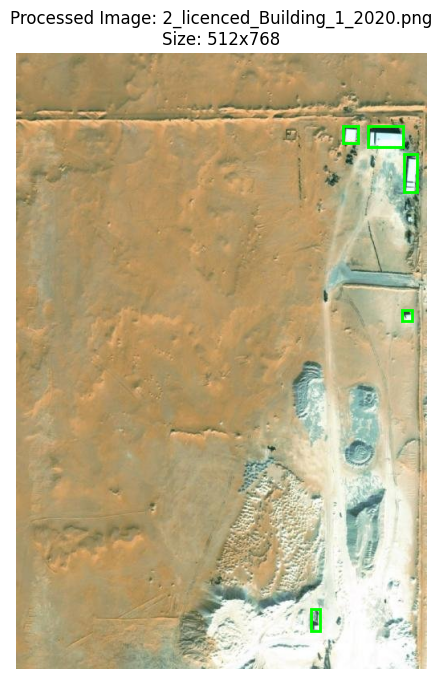

In [8]:
# Usage example:
visualize_processed_image(
    output_dir="/content/Yolo__Data",
    subset="train",
    img_filename="2_licenced_Building_1_2020.png"
)

### **Step 3:** Train YOLOv8 Model

In [9]:
# Configuration (Optimized for Colab)
TARGET_SIZE = 1280
data_yml = "/content/data.yaml"

In [10]:
def train_yolo():
    """Trains a YOLOv8 model with customized parameters."""
    torch.cuda.empty_cache()  # Clear GPU memory before training

    model = YOLO('yolov8m.pt')  # Load the YOLOv8 medium model

    results = model.train(
        data=data_yml,  # Path to dataset YAML file
        imgsz=TARGET_SIZE,  # Image size for training
        patience=15,  # Stop training if no improvement for 15 epochs
        epochs=100,  # Total training epochs
        batch=4,  # Batch size
        lr0=0.001,  # Initial learning rate
        weight_decay=0.0005,  # Regularization to prevent overfitting
        box=7.5,  # Box loss coefficient
        mosaic=1.0,  # Data augmentation (image mixing)
        mixup=0.0,  # Data augmentation (mixing images)
        degrees=10.0,  # Rotation augmentation
        shear=0.0,  # Shear augmentation
        perspective=0.0001,  # Perspective distortion augmentation
        copy_paste=0.0,  # Copy-paste augmentation
        overlap_mask=False,  # No overlap masking
        single_cls=True,  # Single-class training (buildings only)
        save=True,  # Save the best model
        project="runs/yolo_training",  # Directory to save training runs
        name="exp1"  # Experiment name
    )

### **Execute Training**

In [11]:
train_yolo()  # Train the YOLOv8 model

100%|██████████| 49.7M/49.7M [00:00<00:00, 226MB/s]


Ultralytics 8.3.71 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/data.yaml, epochs=100, time=None, patience=15, batch=4, imgsz=1280, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/yolo_training, name=exp1, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=True, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=False, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_

100%|██████████| 755k/755k [00:00<00:00, 19.7MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 84.5MB/s]


AMP: checks passed ✅


train: Scanning /content/Yolo__Data/train... 184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<00:00, 608.78it/s]


train: New cache created: /content/Yolo__Data/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.3 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/Yolo__Data/val... 24 images, 0 backgrounds, 0 corrupt: 100%|██████████| 24/24 [00:00<00:00, 123.63it/s]

val: New cache created: /content/Yolo__Data/val.cache


Plotting labels to runs/yolo_training/exp1/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1280 train, 1280 val
Using 2 dataloader workers
Logging results to runs/yolo_training/exp1
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.14G      2.112      3.609      1.207         42       1280: 100%|██████████| 46/46 [00:27<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.21s/it]

                   all         24        393      0.298      0.258      0.176     0.0741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       7.3G      2.191      5.654      1.285         49       1280: 100%|██████████| 46/46 [00:25<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.04it/s]

                   all         24        393     0.0378      0.117     0.0123    0.00459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      7.89G      2.266      3.932      1.294         67       1280: 100%|██████████| 46/46 [00:28<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all         24        393     0.0016     0.0254   0.000803   0.000341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.03G      2.283      3.222      1.263         67       1280: 100%|██████████| 46/46 [00:28<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all         24        393     0.0404     0.0407    0.00456    0.00183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      7.98G      2.331       2.38      1.248         30       1280: 100%|██████████| 46/46 [00:26<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all         24        393      0.204       0.12     0.0818     0.0322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.95G      2.198      2.145      1.238         73       1280: 100%|██████████| 46/46 [00:25<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all         24        393      0.298      0.186      0.121     0.0455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      8.19G      2.349      2.085      1.307         36       1280: 100%|██████████| 46/46 [00:27<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         24        393      0.288      0.214      0.157     0.0545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       7.9G       2.24      2.218      1.272         91       1280: 100%|██████████| 46/46 [00:27<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.32it/s]

                   all         24        393       0.31      0.224      0.159     0.0598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.99G      2.242      1.988       1.26         39       1280: 100%|██████████| 46/46 [00:26<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all         24        393       0.38      0.229      0.172      0.061



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      7.22G      2.168      1.858      1.246         85       1280: 100%|██████████| 46/46 [00:26<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]

                   all         24        393      0.315      0.181      0.132     0.0489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      9.79G      2.154      1.808      1.211         37       1280: 100%|██████████| 46/46 [00:27<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         24        393      0.328      0.211       0.14     0.0494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       7.8G      2.227      2.194      1.213         85       1280: 100%|██████████| 46/46 [00:26<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all         24        393       0.28      0.239      0.169     0.0772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      9.06G      2.069      1.729      1.159         45       1280: 100%|██████████| 46/46 [00:27<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.03it/s]

                   all         24        393      0.322      0.239      0.168      0.078



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.78G      2.014      1.677      1.213        190       1280: 100%|██████████| 46/46 [00:26<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         24        393      0.308      0.223      0.168     0.0714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.92G      2.035      1.669      1.161        112       1280: 100%|██████████| 46/46 [00:27<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all         24        393      0.402      0.269      0.221     0.0849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      7.13G       2.02      1.587      1.186         68       1280: 100%|██████████| 46/46 [00:26<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.61it/s]

                   all         24        393      0.388      0.244      0.204     0.0864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.84G       1.99      1.627      1.184         49       1280: 100%|██████████| 46/46 [00:26<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all         24        393      0.349      0.265      0.204      0.092



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.87G      1.934      1.602       1.18        125       1280: 100%|██████████| 46/46 [00:25<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         24        393      0.366      0.244      0.192     0.0841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.29G      1.967      1.697      1.171         48       1280: 100%|██████████| 46/46 [00:27<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all         24        393      0.306      0.249      0.172     0.0685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.03G      1.918      1.611      1.134         52       1280: 100%|██████████| 46/46 [00:27<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all         24        393      0.382      0.274      0.205     0.0867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.29G      2.003      1.604      1.171        107       1280: 100%|██████████| 46/46 [00:26<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all         24        393      0.424      0.229       0.21      0.092



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.06G      1.953      1.548      1.179         95       1280: 100%|██████████| 46/46 [00:27<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all         24        393      0.282      0.232       0.18     0.0739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.32G      1.934      1.553      1.167         72       1280: 100%|██████████| 46/46 [00:26<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         24        393      0.387      0.219      0.209     0.0926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.87G      1.914      1.523      1.159         49       1280: 100%|██████████| 46/46 [00:25<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]

                   all         24        393      0.453      0.237      0.221     0.0957



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       8.1G      1.872      1.496      1.175         41       1280: 100%|██████████| 46/46 [00:25<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.04it/s]

                   all         24        393      0.383      0.257      0.209     0.0961



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.81G      1.944      1.477      1.158         43       1280: 100%|██████████| 46/46 [00:25<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all         24        393      0.382      0.242      0.195     0.0834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.27G      1.866      1.511      1.121         49       1280: 100%|██████████| 46/46 [00:26<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all         24        393      0.364      0.272      0.223      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         8G      1.898      1.525       1.17        297       1280: 100%|██████████| 46/46 [00:27<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]

                   all         24        393      0.383      0.295      0.231     0.0969



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.65G      1.859      1.509      1.124         39       1280: 100%|██████████| 46/46 [00:28<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.25it/s]

                   all         24        393      0.345       0.26      0.205      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100       7.5G      1.837       1.39      1.101         30       1280: 100%|██████████| 46/46 [00:26<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.31it/s]

                   all         24        393      0.422      0.249      0.219        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       6.9G      1.855      1.482      1.125         46       1280: 100%|██████████| 46/46 [00:27<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

                   all         24        393      0.416       0.28       0.22     0.0963



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.29G      1.806      1.378      1.124         25       1280: 100%|██████████| 46/46 [00:25<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         24        393      0.365      0.285      0.223      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.13G       1.82      1.512      1.084         55       1280: 100%|██████████| 46/46 [00:25<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         24        393      0.367      0.262      0.209     0.0991



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.63G      1.799      1.442      1.103         67       1280: 100%|██████████| 46/46 [00:27<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         24        393      0.404      0.266      0.209      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         8G       1.76      1.413       1.08         62       1280: 100%|██████████| 46/46 [00:27<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all         24        393      0.407       0.28      0.234      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.87G      1.803      1.411      1.149         18       1280: 100%|██████████| 46/46 [00:25<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]

                   all         24        393      0.333      0.285       0.21     0.0923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         8G       1.86      1.435      1.121         77       1280: 100%|██████████| 46/46 [00:25<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         24        393      0.369       0.27      0.231     0.0974



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.84G      1.801      1.411       1.12         51       1280: 100%|██████████| 46/46 [00:27<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]

                   all         24        393      0.386       0.29      0.236      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.07G      1.796      1.337      1.107        122       1280: 100%|██████████| 46/46 [00:26<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.02it/s]

                   all         24        393      0.478      0.262       0.25      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.27G       1.78      1.345      1.133         63       1280: 100%|██████████| 46/46 [00:26<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         24        393      0.367      0.309      0.242      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.66G      1.771      1.323      1.088        119       1280: 100%|██████████| 46/46 [00:29<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         24        393      0.383      0.265      0.227     0.0959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      9.15G      1.837      1.346      1.079         55       1280: 100%|██████████| 46/46 [00:26<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]

                   all         24        393      0.424      0.262      0.242      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.61G      1.727       1.34      1.102         64       1280: 100%|██████████| 46/46 [00:26<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         24        393       0.42      0.288      0.239      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.04G      1.756      1.457      1.101         51       1280: 100%|██████████| 46/46 [00:27<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         24        393      0.431      0.272      0.246      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.91G      1.761      1.491      1.103         37       1280: 100%|██████████| 46/46 [00:26<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]

                   all         24        393      0.454       0.27      0.246      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      8.32G      1.803      1.543       1.07         53       1280: 100%|██████████| 46/46 [00:25<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all         24        393      0.363      0.275      0.228      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.98G      1.723      1.289      1.082         65       1280: 100%|██████████| 46/46 [00:27<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all         24        393      0.439      0.303      0.252      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.32G      1.769      1.326      1.125         12       1280: 100%|██████████| 46/46 [00:26<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

                   all         24        393      0.422      0.293      0.243      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.94G       1.83      1.281      1.078         32       1280: 100%|██████████| 46/46 [00:26<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

                   all         24        393      0.347      0.276      0.212     0.0878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.92G       1.87      1.351      1.103         51       1280: 100%|██████████| 46/46 [00:25<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         24        393      0.404      0.295       0.23     0.0966



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.29G      1.878      1.361      1.101         39       1280: 100%|██████████| 46/46 [00:28<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all         24        393      0.417       0.27      0.219     0.0986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.93G      1.732      1.357      1.112         30       1280: 100%|██████████| 46/46 [00:26<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all         24        393      0.377       0.27      0.217     0.0971



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.01G      1.672      1.185      1.086         38       1280: 100%|██████████| 46/46 [00:25<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         24        393      0.377      0.323       0.23      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.89G      1.723      1.266      1.083         42       1280: 100%|██████████| 46/46 [00:26<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         24        393      0.436      0.305      0.238      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.07G      1.713      1.249      1.032         45       1280: 100%|██████████| 46/46 [00:27<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]

                   all         24        393      0.381      0.282      0.226      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100       7.8G      1.735      1.296      1.091         54       1280: 100%|██████████| 46/46 [00:27<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all         24        393      0.411      0.267      0.224     0.0958



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100       6.9G      1.764      1.253       1.11         79       1280: 100%|██████████| 46/46 [00:26<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         24        393      0.448      0.252      0.234       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.04G      1.668      1.276       1.08        365       1280: 100%|██████████| 46/46 [00:27<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         24        393      0.366      0.265      0.221      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.98G      1.607      1.166      1.028         12       1280: 100%|██████████| 46/46 [00:26<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]

                   all         24        393      0.418        0.3      0.238      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.03G      1.673      1.328      1.064         50       1280: 100%|██████████| 46/46 [00:26<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         24        393      0.383      0.273      0.223      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         8G       1.66       1.19      1.065        323       1280: 100%|██████████| 46/46 [00:28<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         24        393      0.364      0.305      0.231      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.03G      1.701      1.219      1.054        114       1280: 100%|██████████| 46/46 [00:26<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         24        393      0.362      0.291      0.228      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      7.98G      1.612      1.197      1.052         40       1280: 100%|██████████| 46/46 [00:26<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all         24        393      0.397      0.295      0.248      0.115
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 48, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



63 epochs completed in 0.555 hours.
Optimizer stripped from runs/yolo_training/exp1/weights/last.pt, 52.1MB
Optimizer stripped from runs/yolo_training/exp1/weights/best.pt, 52.1MB

Validating runs/yolo_training/exp1/weights/best.pt...
Ultralytics 8.3.71 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


                   all         24        393      0.425      0.293      0.244      0.117
Speed: 1.1ms preprocess, 41.4ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to runs/yolo_training/exp1


### **Step 4:** Validate YOLOv8 Model

In [12]:
def validate_model():
    """Validates the trained YOLOv8 model using mAP metrics."""
    best_model = YOLO(f'runs/yolo_training/exp1/weights/best.pt')  # Load best trained model

    metrics = best_model.val(
        data="/content/data.yaml",  # Path to validation dataset
        imgsz=TARGET_SIZE,  # Image size for validation
        batch=4,  # Batch size for validation
        conf=0.25,  # Confidence threshold (lowered for small objects)
        iou=0.45  # Intersection over Union (IoU) threshold
    )

    # Print mean Average Precision (mAP) results
    print(f"mAP50-95: {metrics.box.map}")
    print(f"mAP50: {metrics.box.map50}")

## **Execute Validation**

In [13]:
validate_model()  # Evaluate the trained model

Ultralytics 8.3.71 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/Yolo__Data/val.cache... 24 images, 0 backgrounds, 0 corrupt: 100%|██████████| 24/24 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.09it/s]


                   all         24        393      0.503      0.247      0.364      0.199
Speed: 0.9ms preprocess, 88.7ms inference, 0.0ms loss, 7.1ms postprocess per image
Results saved to runs/detect/val
mAP50-95: 0.19864852054780688
mAP50: 0.36412961865854454


##### **Save The Best Model(best.pt)**

In [15]:
# Path where YOLO saves the best model
best_model_path = "runs/yolo_training/exp1/weights/best.pt"

# Ensure the model exists before copying
if os.path.exists(best_model_path):
    # Create a directory to store the best model for deployment
    os.makedirs("models", exist_ok=True)

    # Move the best model to the deployment folder
    shutil.copy(best_model_path, "models/best.pt")
    print("✅ Best model saved successfully for deployment: models/best.pt")
else:
    print("❌ Best model not found. Check training output.")

✅ Best model saved successfully for deployment: models/best.pt



0: 1280x960 1 building, 70.6ms
Speed: 10.2ms preprocess, 70.6ms inference, 1.7ms postprocess per image at shape (1, 3, 1280, 960)


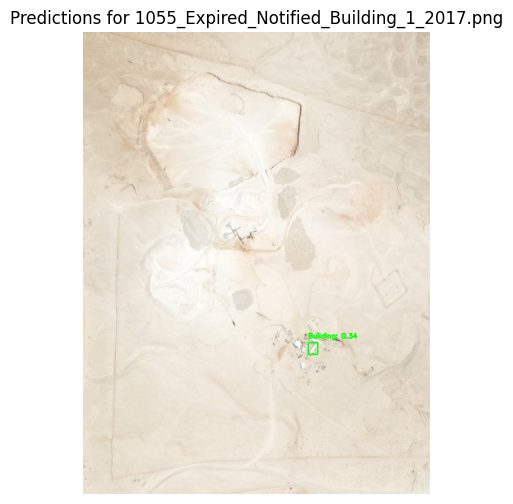


0: 1280x864 3 buildings, 61.8ms
Speed: 11.1ms preprocess, 61.8ms inference, 1.4ms postprocess per image at shape (1, 3, 1280, 864)


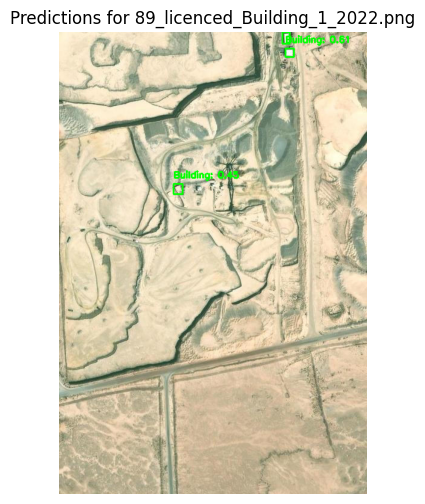


0: 1280x1280 2 buildings, 77.4ms
Speed: 16.5ms preprocess, 77.4ms inference, 1.5ms postprocess per image at shape (1, 3, 1280, 1280)


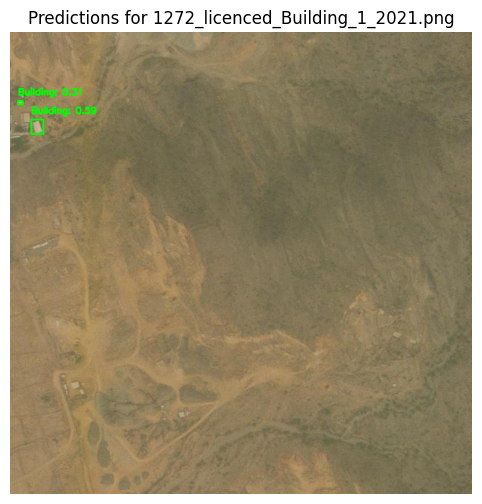


0: 864x1280 (no detections), 74.7ms
Speed: 10.4ms preprocess, 74.7ms inference, 0.9ms postprocess per image at shape (1, 3, 864, 1280)


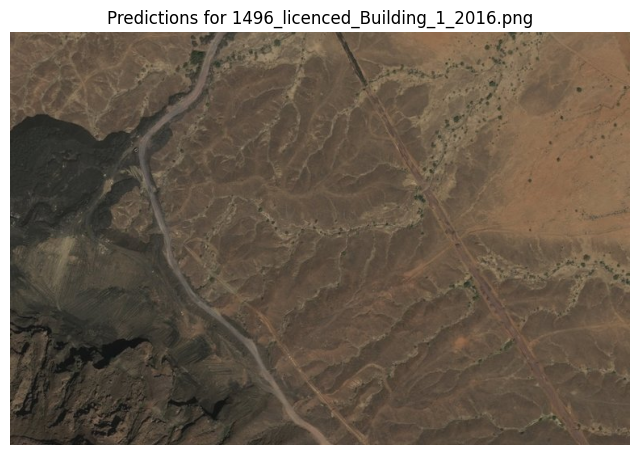


0: 1280x640 1 building, 73.8ms
Speed: 8.1ms preprocess, 73.8ms inference, 2.1ms postprocess per image at shape (1, 3, 1280, 640)


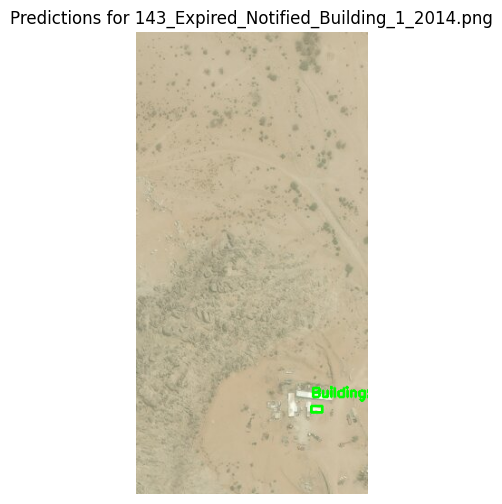


0: 1280x1280 2 buildings, 108.9ms
Speed: 14.9ms preprocess, 108.9ms inference, 1.4ms postprocess per image at shape (1, 3, 1280, 1280)


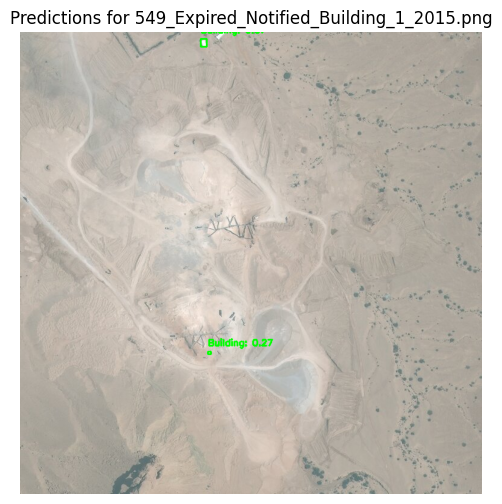


0: 1280x1120 3 buildings, 111.6ms
Speed: 16.3ms preprocess, 111.6ms inference, 1.5ms postprocess per image at shape (1, 3, 1280, 1120)


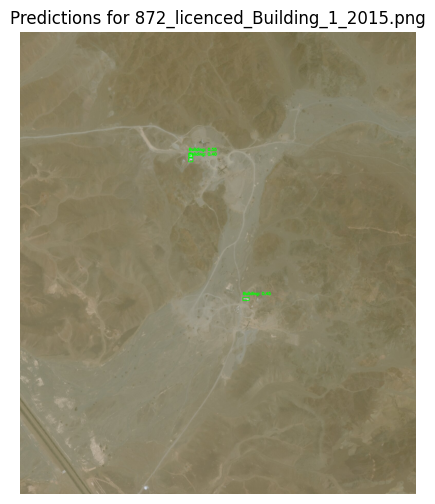


0: 960x1280 5 buildings, 72.3ms
Speed: 11.8ms preprocess, 72.3ms inference, 1.7ms postprocess per image at shape (1, 3, 960, 1280)


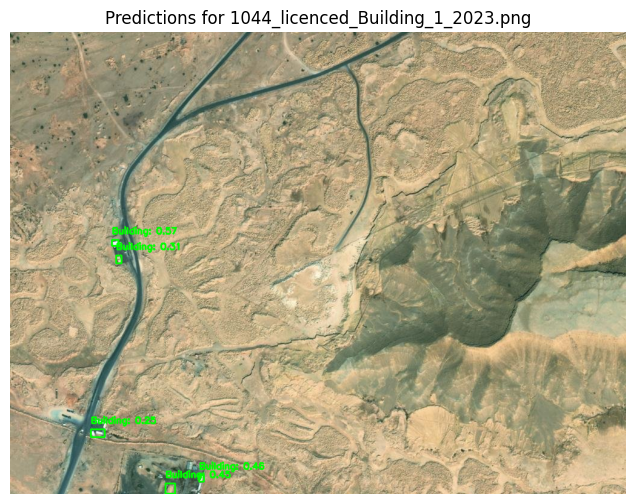


0: 1280x1280 1 building, 117.8ms
Speed: 34.9ms preprocess, 117.8ms inference, 1.9ms postprocess per image at shape (1, 3, 1280, 1280)


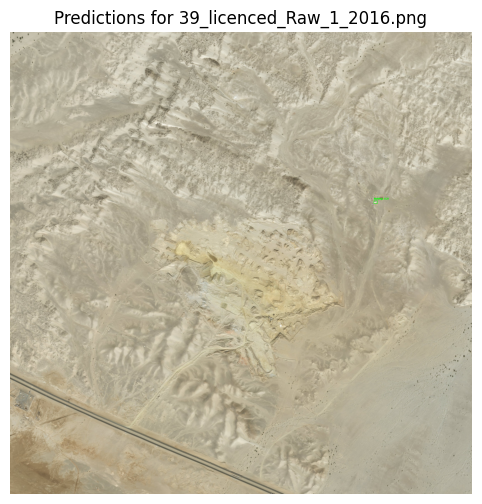


0: 1280x960 4 buildings, 92.2ms
Speed: 14.8ms preprocess, 92.2ms inference, 1.9ms postprocess per image at shape (1, 3, 1280, 960)


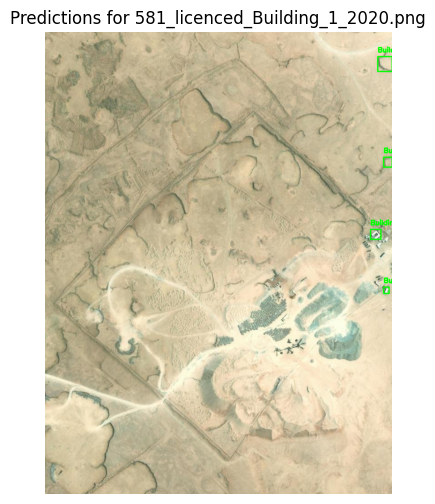


0: 1280x960 (no detections), 90.8ms
Speed: 14.8ms preprocess, 90.8ms inference, 1.0ms postprocess per image at shape (1, 3, 1280, 960)


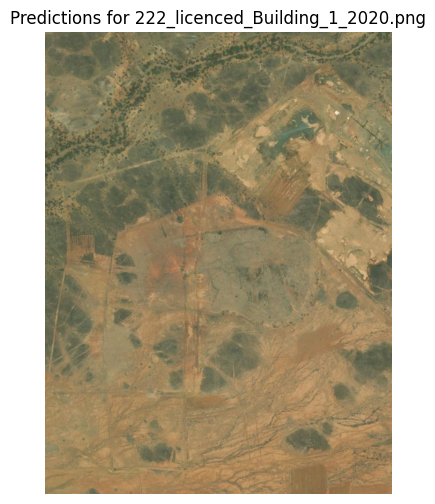


0: 1280x864 4 buildings, 79.7ms
Speed: 10.1ms preprocess, 79.7ms inference, 1.9ms postprocess per image at shape (1, 3, 1280, 864)


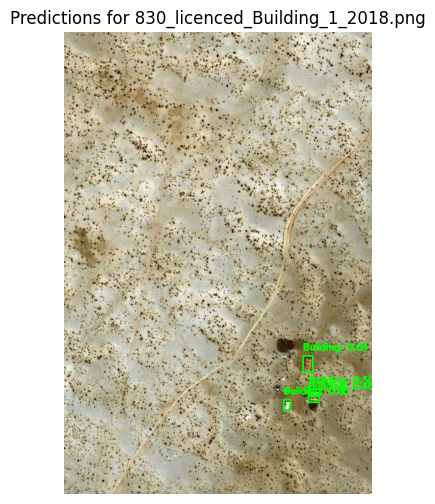


0: 1280x1280 1 building, 138.2ms
Speed: 14.3ms preprocess, 138.2ms inference, 14.0ms postprocess per image at shape (1, 3, 1280, 1280)


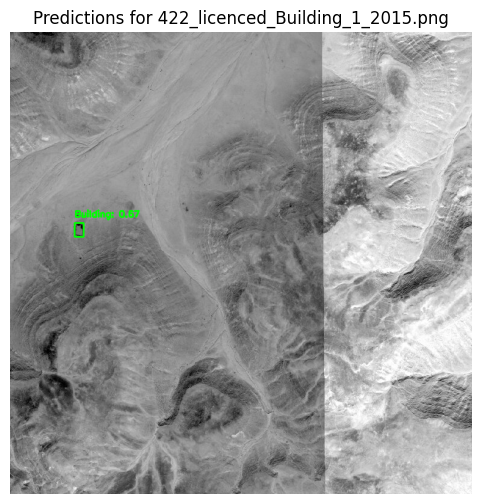


0: 1280x1120 1 building, 83.8ms
Speed: 20.8ms preprocess, 83.8ms inference, 1.8ms postprocess per image at shape (1, 3, 1280, 1120)


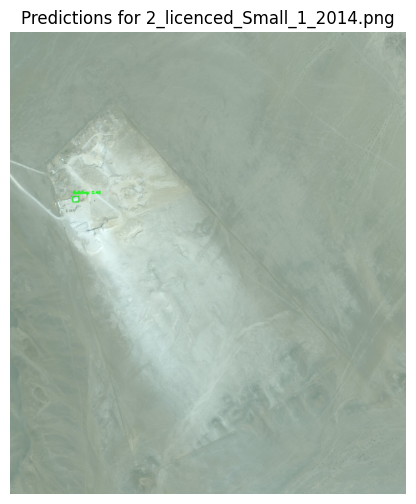


0: 1280x1280 2 buildings, 117.9ms
Speed: 16.1ms preprocess, 117.9ms inference, 1.9ms postprocess per image at shape (1, 3, 1280, 1280)


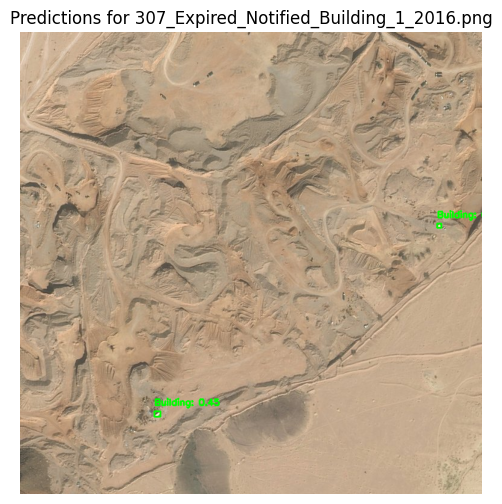


0: 1280x1280 1 building, 86.5ms
Speed: 16.6ms preprocess, 86.5ms inference, 2.0ms postprocess per image at shape (1, 3, 1280, 1280)


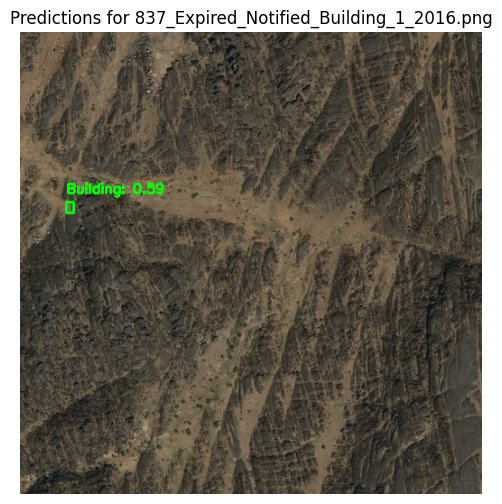


0: 864x1280 4 buildings, 61.9ms
Speed: 12.2ms preprocess, 61.9ms inference, 1.9ms postprocess per image at shape (1, 3, 864, 1280)


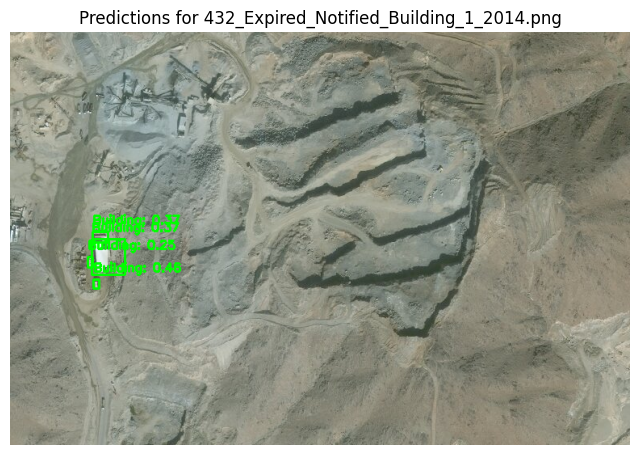


0: 960x1280 1 building, 64.1ms
Speed: 11.5ms preprocess, 64.1ms inference, 2.0ms postprocess per image at shape (1, 3, 960, 1280)


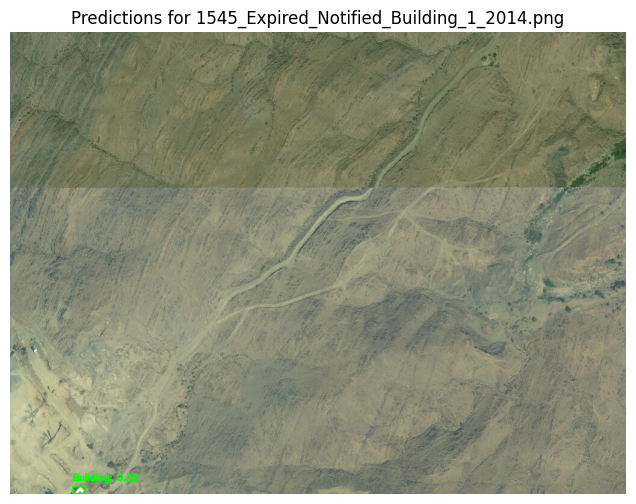


0: 1280x1280 4 buildings, 117.6ms
Speed: 26.7ms preprocess, 117.6ms inference, 1.9ms postprocess per image at shape (1, 3, 1280, 1280)


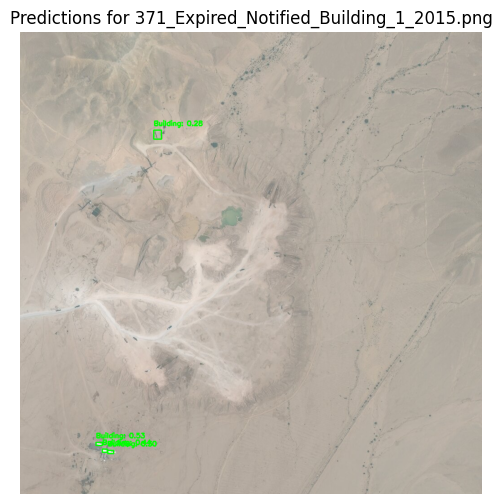


0: 864x1280 2 buildings, 64.2ms
Speed: 10.4ms preprocess, 64.2ms inference, 1.9ms postprocess per image at shape (1, 3, 864, 1280)


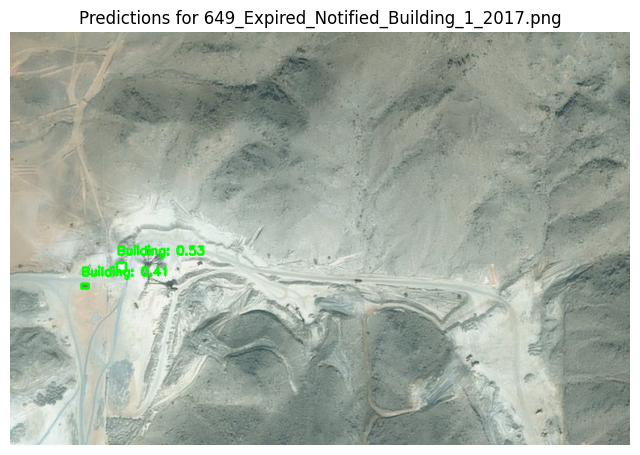


0: 1280x1280 4 buildings, 86.4ms
Speed: 14.7ms preprocess, 86.4ms inference, 1.7ms postprocess per image at shape (1, 3, 1280, 1280)


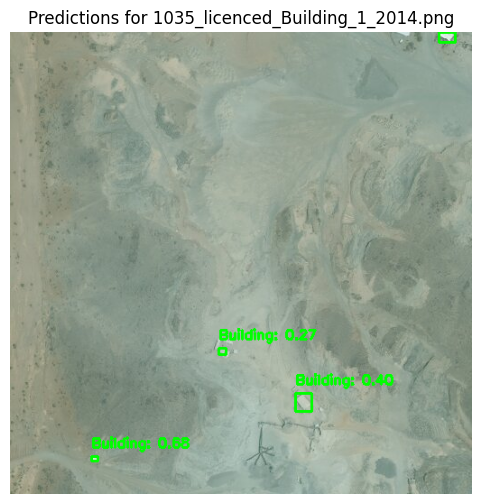


0: 1280x1280 9 buildings, 80.3ms
Speed: 17.1ms preprocess, 80.3ms inference, 1.9ms postprocess per image at shape (1, 3, 1280, 1280)


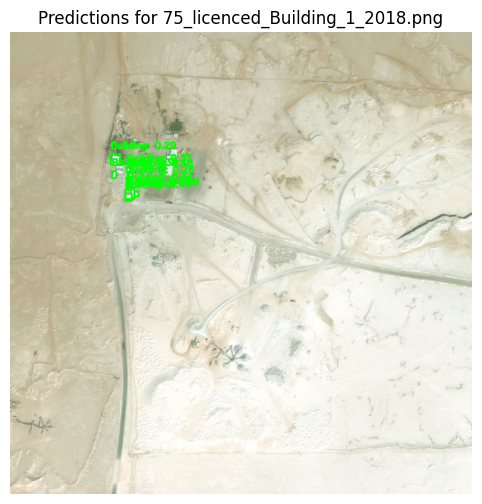


0: 1280x960 (no detections), 62.9ms
Speed: 12.8ms preprocess, 62.9ms inference, 0.7ms postprocess per image at shape (1, 3, 1280, 960)


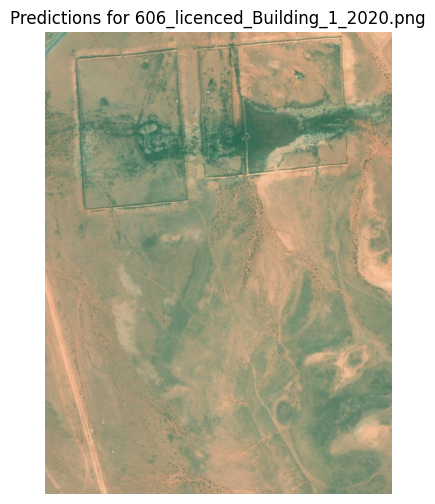


0: 1280x1280 3 buildings, 80.8ms
Speed: 17.7ms preprocess, 80.8ms inference, 1.8ms postprocess per image at shape (1, 3, 1280, 1280)


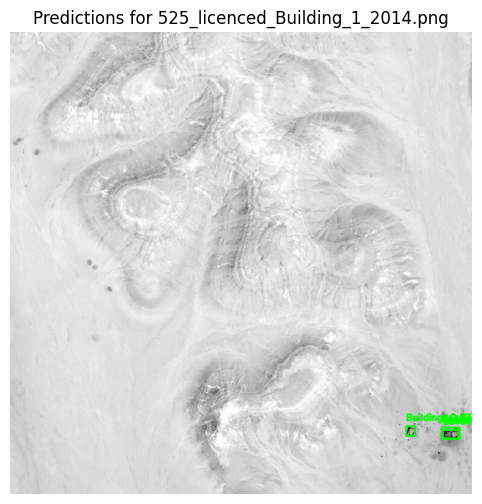


0: 1280x640 11 buildings, 53.1ms
Speed: 8.2ms preprocess, 53.1ms inference, 1.7ms postprocess per image at shape (1, 3, 1280, 640)


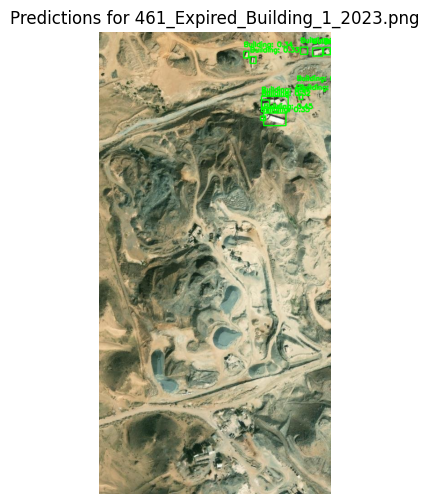


0: 1280x1280 8 buildings, 109.2ms
Speed: 14.8ms preprocess, 109.2ms inference, 1.7ms postprocess per image at shape (1, 3, 1280, 1280)


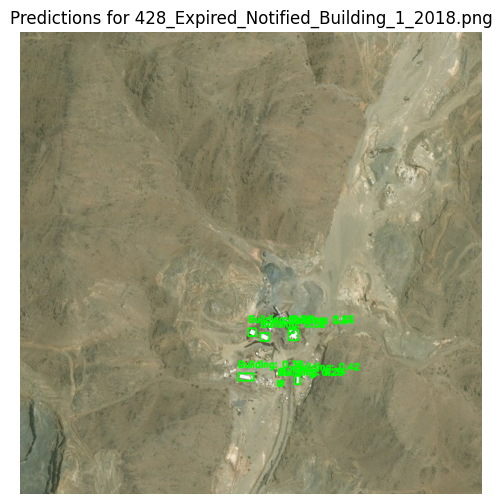


0: 1280x640 1 building, 51.2ms
Speed: 9.4ms preprocess, 51.2ms inference, 2.1ms postprocess per image at shape (1, 3, 1280, 640)


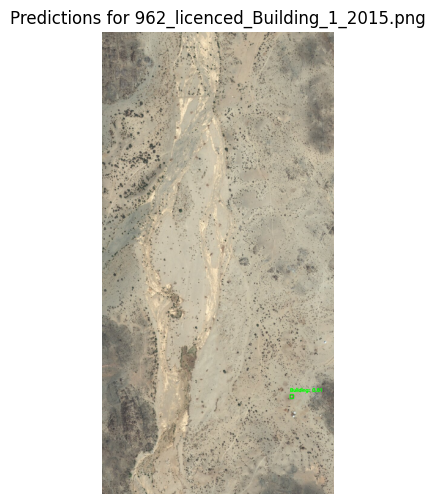


0: 1280x864 (no detections), 72.7ms
Speed: 15.2ms preprocess, 72.7ms inference, 0.8ms postprocess per image at shape (1, 3, 1280, 864)


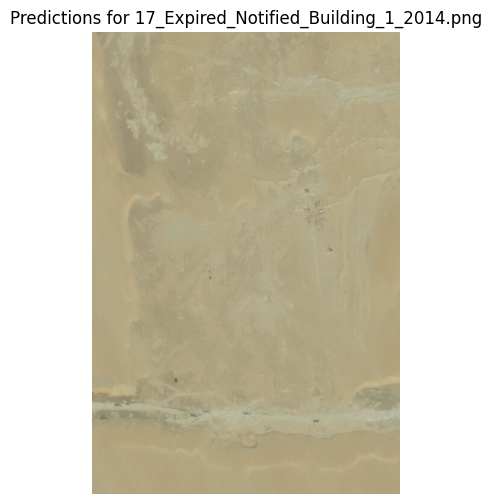


0: 1280x1280 (no detections), 120.8ms
Speed: 16.8ms preprocess, 120.8ms inference, 0.9ms postprocess per image at shape (1, 3, 1280, 1280)


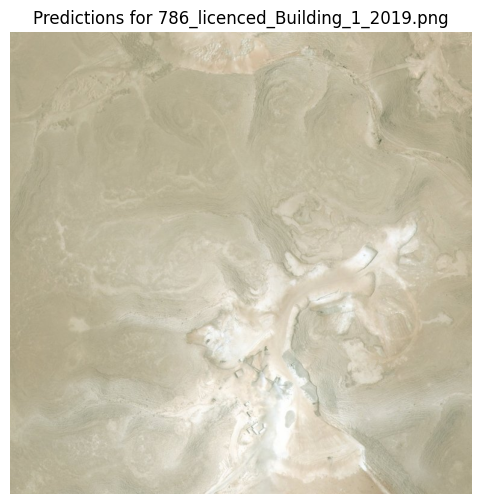


0: 640x1280 (no detections), 72.4ms
Speed: 9.1ms preprocess, 72.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 1280)


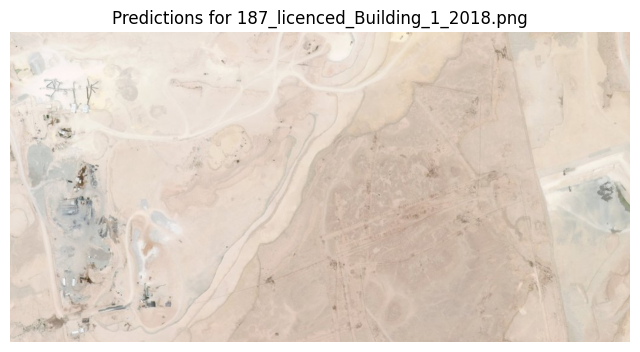


0: 1280x960 (no detections), 92.0ms
Speed: 17.3ms preprocess, 92.0ms inference, 0.7ms postprocess per image at shape (1, 3, 1280, 960)


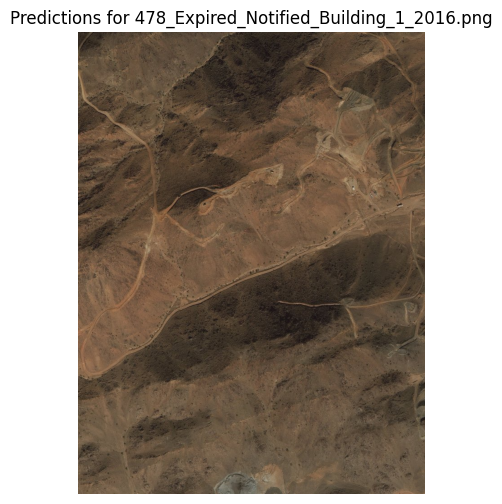


0: 960x1280 2 buildings, 91.8ms
Speed: 15.5ms preprocess, 91.8ms inference, 1.9ms postprocess per image at shape (1, 3, 960, 1280)


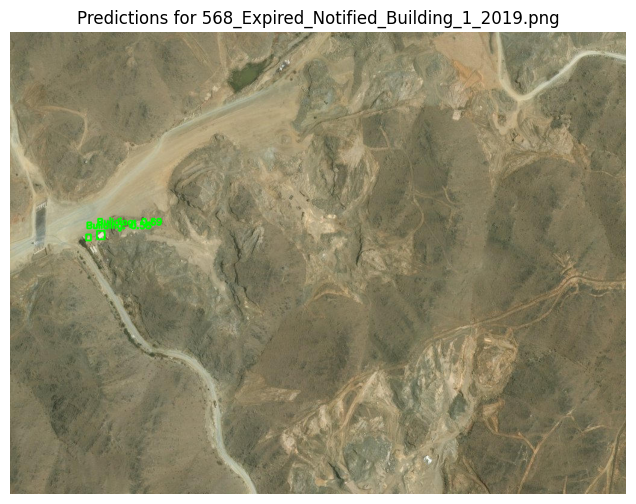


0: 1280x864 (no detections), 79.2ms
Speed: 10.0ms preprocess, 79.2ms inference, 0.8ms postprocess per image at shape (1, 3, 1280, 864)


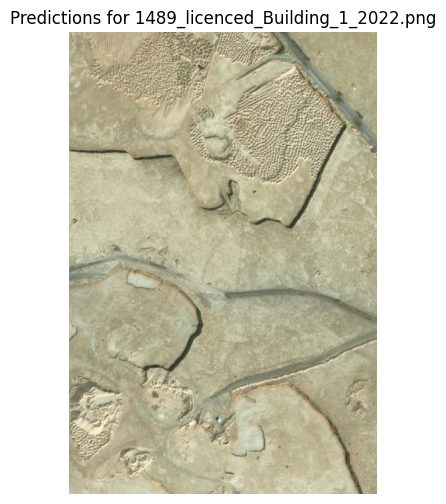

In [16]:
MODEL_PATH = "models/best.pt"
model = YOLO(MODEL_PATH)

# Define test dataset path
TEST_IMAGES_DIR = "/content/Yolo__Data/test"  # Update this path
OUTPUT_DIR = "predictions"  # Save predicted images

# Create output directory if it doesn't exist
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Get all test images
test_images = [f for f in os.listdir(TEST_IMAGES_DIR) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Iterate through test images
for img_name in test_images:
    img_path = os.path.join(TEST_IMAGES_DIR, img_name)

    # Read image
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

    # Run inference
    results = model(image_rgb)

    # Draw bounding boxes
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box
            confidence = box.conf[0].item()  # Confidence score

            # Draw rectangle on image
            cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image_rgb, f"Building: {confidence:.2f}", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Save the prediction image
    output_path = os.path.join(OUTPUT_DIR, img_name)
    Image.fromarray(image_rgb).save(output_path)

    # Display results
    plt.figure(figsize=(8, 6))
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title(f"Predictions for {img_name}")
    plt.show()

**Note: Predicted Images Stored to `/imgs/predicted_imgs` path**

### **Conclusion:**

- This script effectively trains and validates a YOLOv8 model for tiny object detection (buildings). It includes data augmentation, bounding box visualization, and evaluation to ensure optimal performance. Adjust hyperparameters as needed to improve accuracy!
